In [1]:
from platform import python_version
python_version()

'3.10.6'

In [2]:
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict
import operator as op
from cytoolz import compose

import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs
from pyscenic.transform import df2regulons
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_binarization, plot_rss

from IPython.display import HTML, display
import loompy as lp

In [3]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 20

In [4]:
os.getcwd()

'/mnt/cho_lab/disk2/jiayuzh/projects/perianal-cd/analysis/scenic/scripts'

In [5]:
os.chdir('/mnt/cho_lab/disk2/jiayuzh/projects/perianal-cd/analysis/scenic')

Folder Structure

In [6]:
RESOURCES_FOLDERNAME = "./resources/"
AUXILLIARIES_FOLDERNAME = "./auxilliaries/"
RESULTS_FOLDERNAME = "./results/"
FIGURES_FOLDERNAME = "./figures/"

In [7]:
sc.settings.figdir = FIGURES_FOLDERNAME

Auxilliary functions.

In [8]:
BASE_URL = "http://motifcollections.aertslab.org/v10/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

In [9]:
def savesvg(fname: str, fig, folder: str=FIGURES_FOLDERNAME) -> None:
    """
    Save figure as vector-based SVG image format.
    """
    fig.tight_layout()
    fig.savefig(os.path.join(folder, fname), format='svg')

In [11]:
def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', -1)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

Auxilliary data sets.

In [12]:
# Downloaded fromm pySCENIC github repo: https://github.com/aertslab/pySCENIC/tree/master/resources
HUMAN_TFS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'allTFs_hg38.txt')
# Ranking databases. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
RANKING_DBS_FNAMES = list(map(lambda fn: os.path.join(AUXILLIARIES_FOLDERNAME, fn),
                       ['hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather',
                       'hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather']))
# Motif annotations. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
MOTIF_ANNOTATIONS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl')

read in the adata

In [42]:
adata = sc.read_h5ad('./results/PerianalCD.h5ad')
adata.uns['log1p'] = {'base': None} # have to do this each time read a h5ad file

STEP 1: Gene regulatory network inference, and generation of co-expression modules
Phase Ia: GRN inference using the GRNBoost2 algorithm

STEP 2-3: Regulon prediction aka cisTarget from CLI

In [13]:
df_motifs = load_motifs('./results/PerianalCD.motifs.csv')
df_motifs.head()

Enrichment            \
                                                 AUC       NES   
TF    MotifID                                                    
AR    tfdimers__MD00413                     0.071188  3.262889   
ASCL1 tfdimers__MD00501                     0.088379  3.026592   
ATF1  transfac_public__M00039               0.059083  4.021136   
      taipale_tf_pairs__JUN_ATGACGTCAT_HT   0.055041  3.516088   
      metacluster_180.3                     0.051319  3.051135   

                                                                 \
                                          MotifSimilarityQvalue   
TF    MotifID                                                     
AR    tfdimers__MD00413                            4.682320e-07   
ASCL1 tfdimers__MD00501                            0.000000e+00   
ATF1  transfac_public__M00039                      2.200490e-06   
      taipale_tf_pairs__JUN_ATGACGTCAT_HT          2.333870e-10   
      metacluster_180.3                            1.061210e-12   

                                                               \
                                          OrthologousIdentity   
TF    MotifID                                                   
AR    tfdimers__MD00413                              1.000000   
ASCL1 tfdimers__MD00501                              1.000000   
ATF1  transfac_public__M00039                        1.000000   
      taipale_tf_pairs__JUN_ATGACGTCAT_HT            0.911439   
      metacluster_180.3                              0.087209   

                                                                                              \
                                                                                  Annotation   
TF    MotifID                                                                                  
AR    tfdimers__MD00413                    gene is annotated for similar motif homer__AGT...   
ASCL1 tfdimers__MD00501                                           gene is directly annotated   
ATF1  transfac_public__M00039              gene is annotated for similar motif dbtfbs__AT...   
      taipale_tf_pairs__JUN_ATGACGTCAT_HT  gene is orthologous to ENSMUSG00000023027 in M...   
      metacluster_180.3                    motif similar to nitta__CrebA_TCAACC20NCAA_KG_...   

                                                                                              \
                                                                                     Context   
TF    MotifID                                                                                  
AR    tfdimers__MD00413                    (activating, hg38_500bp_up_100bp_down_full_tx_...   
ASCL1 tfdimers__MD00501                    (activating, hg38_500bp_up_100bp_down_full_tx_...   
ATF1  transfac_public__M00039              (activating, hg38_500bp_up_100bp_down_full_tx_...   
      taipale_tf_pairs__JUN_ATGACGTCAT_HT  (activating, hg38_500bp_up_100bp_down_full_tx_...   
      metacluster_180.3                    (activating, hg38_500bp_up_100bp_down_full_tx_...   

                                                                                              \
                                                                                 TargetGenes   
TF    MotifID                                                                                  
AR    tfdimers__MD00413                    [(PAQR3, 1.161095353941729), (AR, 1.0), (FLT3,...   
ASCL1 tfdimers__MD00501                    [(PARVG, 0.4169304756499012), (FAM174B, 7.3056...   
ATF1  transfac_public__M00039              [(CSNK1G2, 0.4810397180922268), (ESYT2, 0.7228...   
      taipale_tf_pairs__JUN_ATGACGTCAT_HT  [(ZNHIT6, 0.8345333145359696), (ELP3, 0.398735...   
      metacluster_180.3                    [(THEM6, 1.118176745511763), (DDX60, 0.3883367...   

                                                     
                                          RankAtMax  
TF    MotifID                           

In [15]:
display_logos(df_motifs.head())

/tmp/ipykernel_43244/1961397235.py:20: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


STEP 4: Cellular enrichment aka AUCell
REGULON CREATION
AUCELL

In [14]:
regulons = df2regulons(df_motifs)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [34]:
FOSL1 = regulons[75]
FOSL2 = regulons[76]

In [40]:
df_FOSL1 = pd.DataFrame(FOSL1.genes)
df_FOSL1.to_csv('./results/FOSL1_gene_targets.csv')
df_FOSL2 = pd.DataFrame(FOSL2.genes)
df_FOSL2.to_csv('./results/FOSL2_gene_targets.csv')

OPTIONAL STEP 5 - Regulon activity binarization

don't have to run every time

In [17]:
import json
import zlib
import base64

# collect SCENIC AUCell output
lf = lp.connect( './results/PerianalCD_scenic.loom', mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
auc_mtx.to_csv('./results/PerianalCD.auc.csv')
lf.close()

In [18]:
bin_mtx, thresholds = binarize(auc_mtx)
bin_mtx.to_csv('./results/PerianalCD.bin.csv')
thresholds.to_frame().rename(columns={0:'threshold'}).to_csv('./results/PerianalCD.thresholds.csv')

run this every time

In [13]:
auc_mtx = pd.read_csv('./results/PerianalCD.auc.csv', index_col=0)
bin_mtx = pd.read_csv('./results/PerianalCD.bin.csv', index_col=0)
thresholds = pd.read_csv('./results/PerianalCD.thresholds.csv', index_col=0).threshold

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/pyscenic/plotting.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(auc_mtx[regulon_name], ax=ax, norm_hist=True, bins=bins)
/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/pyscenic/plotting.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwasko

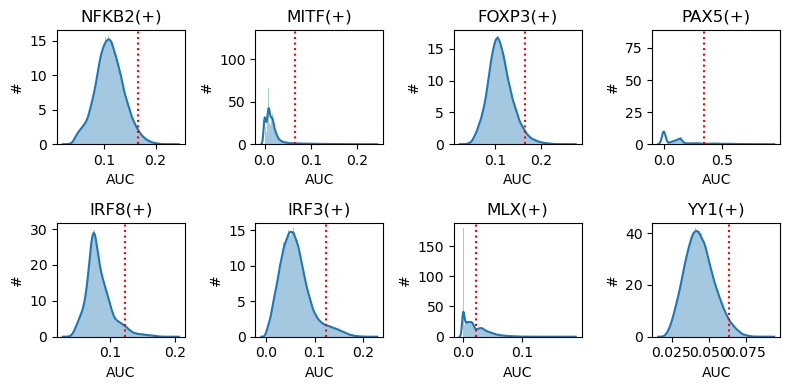

In [20]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(8, 4), dpi=100)

plot_binarization(auc_mtx, 'NFKB2(+)', thresholds['NFKB2(+)'], ax=ax1)
plot_binarization(auc_mtx, 'MITF(+)', thresholds['MITF(+)'], ax=ax2)
plot_binarization(auc_mtx, 'FOXP3(+)', thresholds['FOXP3(+)'], ax=ax3)
plot_binarization(auc_mtx, 'PAX5(+)', thresholds['PAX5(+)'], ax=ax4)
plot_binarization(auc_mtx, 'IRF8(+)', thresholds['IRF8(+)'], ax=ax5)
plot_binarization(auc_mtx, 'IRF3(+)', thresholds['IRF3(+)'], ax=ax6)
plot_binarization(auc_mtx, 'MLX(+)', thresholds['MLX(+)'], ax=ax7)
plot_binarization(auc_mtx, 'YY1(+)', thresholds['YY1(+)'], ax=ax8)

plt.tight_layout()
savesvg('PerianalCD_hists_binarization_thresholds.svg', fig)

In [14]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [15]:
adata.obs.cell_type = adata.obs.cell_type.astype("category")
N_COLORS = len(adata.obs.cell_type.dtype.categories)


In [45]:
COLORS = ['#EEDFCC', '#8B8378', '#7FFFD4', '#458B74', '#0000FF', '#00008B', '#3D9140', 
            '#8A2BE2', '#9C661F', '#CD3333', '#FF6103', '#FFB90F', '#BCEE68', '#6E8B3D',
            '#FF1493', '#8B0A50']

In [46]:
cell_type_color_lut = dict(zip(adata.obs.cell_type.dtype.categories, COLORS))
#cell_type_color_lut = dict(zip(adata.obs.cell_type.dtype.categories, adata.uns['cell_type_colors']))
cell_id2cell_type_lut = adata.obs.cell_type.to_dict()
bw_palette = sns.xkcd_palette(["white", "black"])

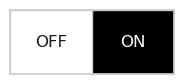

In [30]:
sns.set()
sns.set_style("whitegrid")
fig = palplot(bw_palette, ['OFF', 'ON'], ['k', 'w'])
savesvg('legend_on_off.svg', fig)

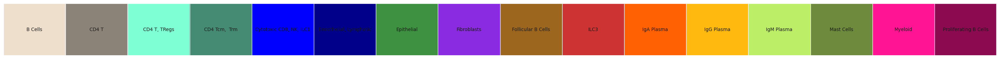

In [40]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot(sns.color_palette(COLORS), adata.obs.cell_type.dtype.categories, size=1.8)
savesvg('legend_cell_type_colors.svg', fig)

In [18]:
barcodes = adata.obs.sort_values(by = ['cell_type']).index
bin_mtx_bycelltype = bin_mtx.T[barcodes].T

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:657: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


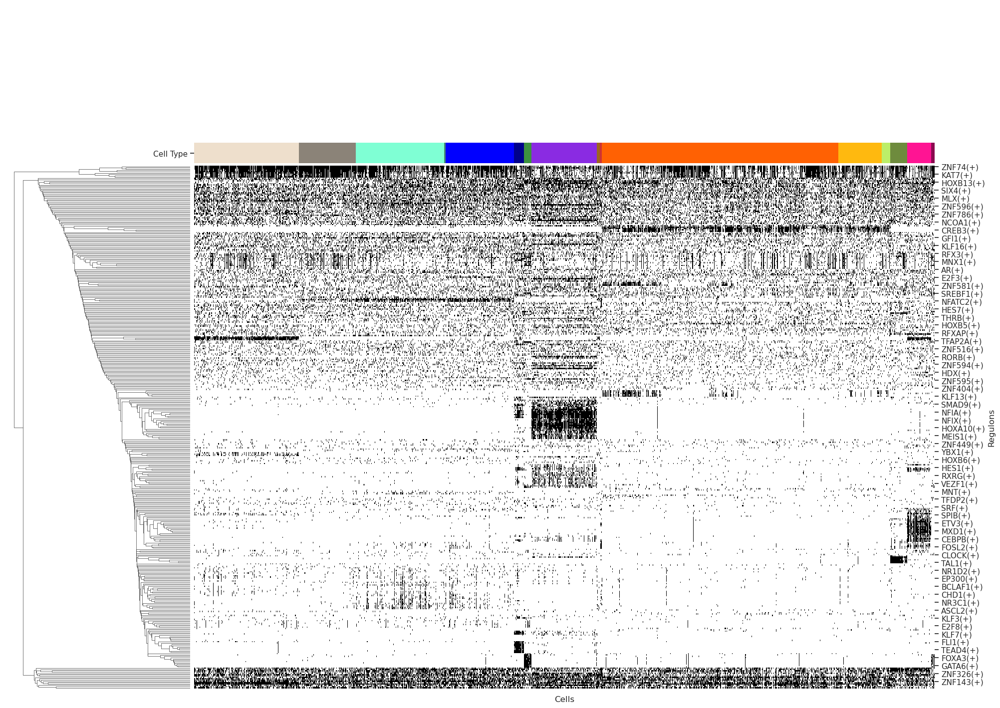

In [26]:
sns.set()
sns.set(font_scale=1.0)
sns.set_style("ticks", {"xtick.minor.size": 1, "ytick.minor.size": 0.1})
g = sns.clustermap(bin_mtx_bycelltype.T, 
               col_colors=bin_mtx_bycelltype.index.map(cell_id2cell_type_lut).map(cell_type_color_lut),
               cmap=bw_palette, figsize=(20,20),col_cluster = False)
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xlabel('Cells')
g.ax_heatmap.set_ylabel('Regulons')
g.ax_col_colors.set_yticks([0.5])
g.ax_col_colors.set_yticklabels(['Cell Type'])
g.cax.set_visible(False)
g.fig.savefig(os.path.join(FIGURES_FOLDERNAME, 'Fistula_bin-auc-score_heatmap.png'), format='png')

STEP 6: Non-linear projection and clustering
In this step a scanpy.AnnData object is created containing all metadata and results.

First, we select and retain only the most variable genes in the dataset.

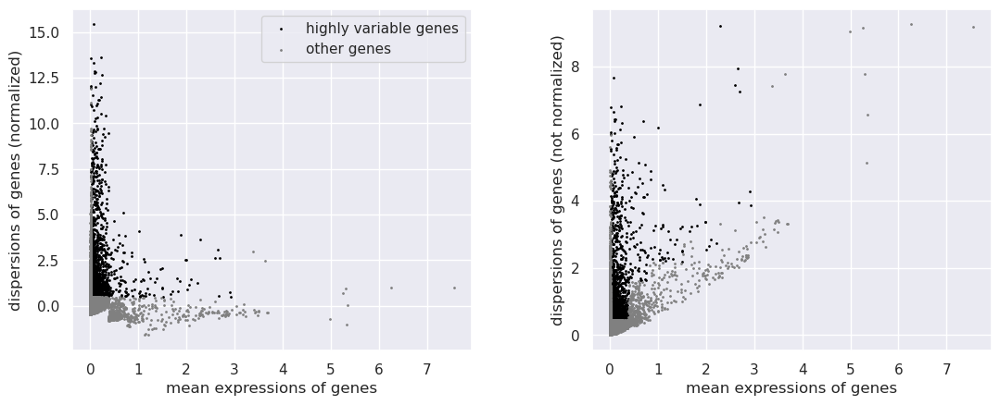

In [19]:
sns.set()
sc.pp.highly_variable_genes(adata)
sc.pl.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]

Then we apply a linear-dimensional reduction technique (PCA).

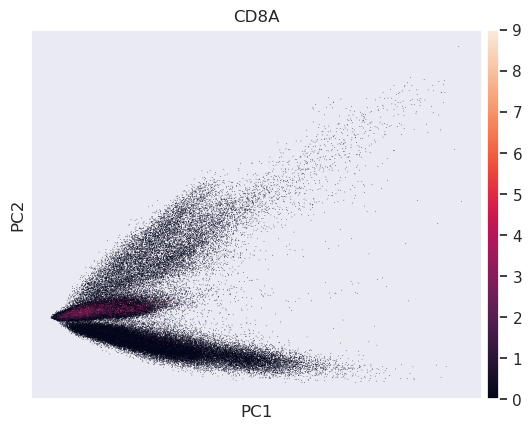

In [20]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca(adata, color='CD8A')

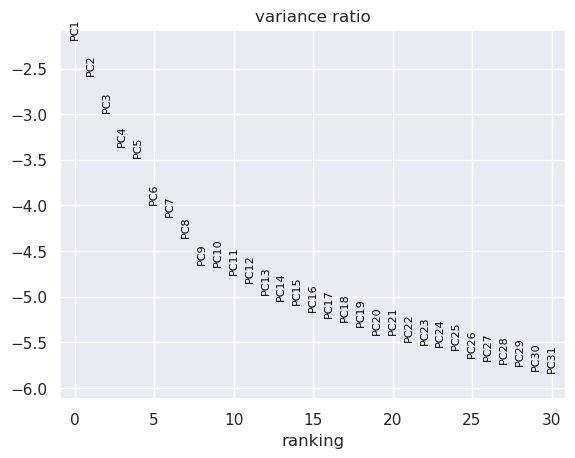

In [21]:
sc.pl.pca_variance_ratio(adata, log=True)

Followed by a tSNE projection.

In [22]:
sc.tl.tsne(adata)

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


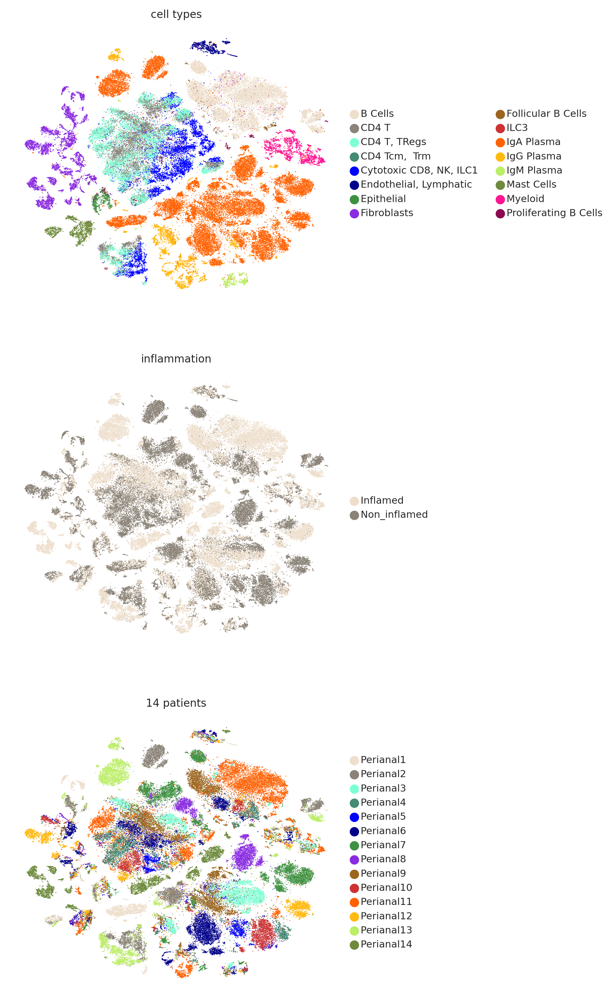

In [23]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'inflammation', 'patient_id'], 
           title=['cell types', 'inflammation',
                 '{} patients'.format(len(adata.obs.patient_id.unique()))], ncols=1, palette=COLORS,
          save='PerianalCD_PCA+tSNE.svg')

We capture the non-linear projection based on PCA+tSNE for later storage in the loom file.

In [24]:
embedding_pca_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

We add all metadata derived from SCENIC to the scanpy.AnnData object.

In [25]:
add_scenic_metadata(adata, auc_mtx, regulons)
adata.write_h5ad('./results/PerianalCD.h5ad')

AUCELL + tSNE PROJECTION
We change the tSNE projection so that it relies on AUCell instead of PCA.

In [43]:
sc.tl.tsne(adata, use_rep='X_aucell')

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


In [27]:
embedding_aucell_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


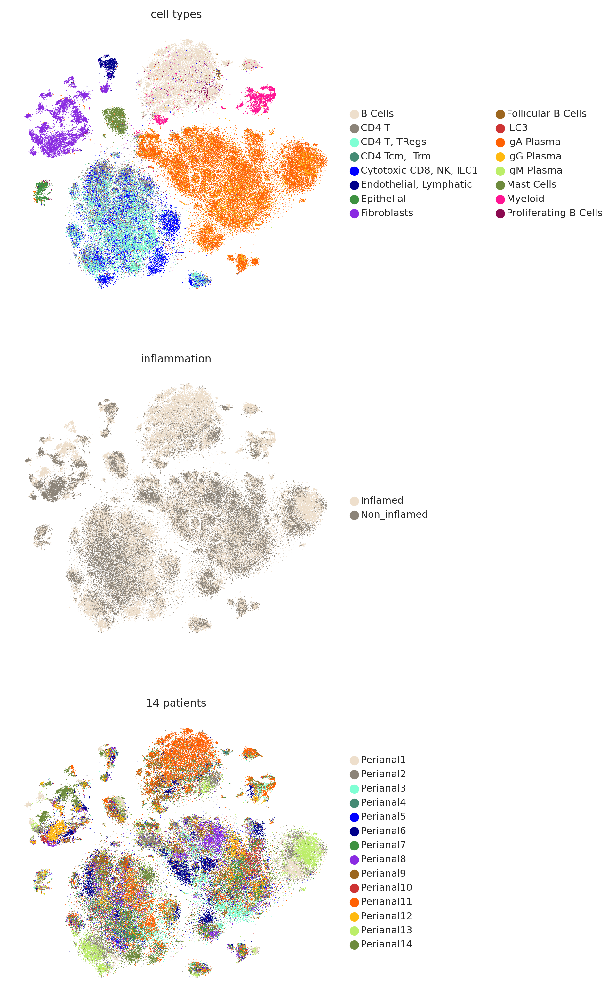

In [28]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'inflammation', 'patient_id'], 
           title=['cell types', 'inflammation',
                 '{} patients'.format(len(adata.obs.patient_id.unique()))], ncols=1, palette=COLORS,
          save='PerianalCD_AUCell+tSNE.svg')

CELL TYPE SPECIFIC REGULATORS - Z-SCORE

To find cell type specific regulators we use a Z score (i.e. the average AUCell score for the cells of a give type are standardized using the overall average AUCell scores and its standard deviation).

In [29]:
df_obs = adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['cell_type']]
df_results = ((df_scores.groupby(by='cell_type').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 3.0)].sort_values('Z', ascending=False).head()

,cell_type,regulon,Z
2259,"Endothelial, Lymphatic",SOX7(+),7.033761
2500,Epithelial,HNF4A(+),6.984807
2429,Epithelial,ELF3(+),6.819043
2256,"Endothelial, Lymphatic",SOX18(+),6.703619
2255,"Endothelial, Lymphatic",SOX17(+),6.543662


In [30]:
df_results[df_results.Z >= 1.8].sort_values('Z', ascending=False).to_csv('./results/PerianalCD_regulons_z-scores.csv')

In [16]:
df_sig = df_results[df_results.Z >= 1.8].sort_values('Z', ascending=False)

In [25]:
regulon_names = np.unique(df_results.regulon)

In [28]:
np.savetxt('./results/regulon_names.txt', regulon_names,  fmt='%s')

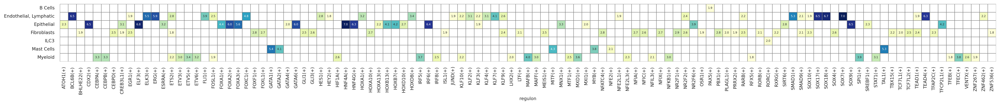

In [31]:
df_heatmap = pd.pivot_table(data=df_results[df_results.Z >= 1.8].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
#df_heatmap.drop(index='Myocyte', inplace=True) # We leave out Myocyte because many TFs are highly enriched (becuase of small number of cells).
fig, ax1 = plt.subplots(1, 1, figsize=(25, 12))
sns.heatmap(df_heatmap, ax=ax1, annot=True, fmt=".1f", linewidths=.7, cbar=False, square=True, linecolor='gray', 
            cmap="YlGnBu", annot_kws={"size": 5})
ax1.set_ylabel('')

savesvg('PerianalCD_sig_regulons_heatmap.svg', fig)

Subset with paired-matched Fistula vs. Tissue

In [41]:
tis_idx = adata.obs.loc[adata.obs.sample_id.isin(["Perianal11_Rect", 'Perianal14_Rect'])].index
fis_idx = adata.obs.loc[adata.obs.sample_id.isin(["Perianal11_Fistula", 'Perianal14_Fistula'])].index
sub_idx = adata.obs.loc[adata.obs.sample_id.isin(["Perianal11_Fistula", 'Perianal14_Fistula', "Perianal11_Rect", 'Perianal14_Rect'])].index

In [42]:
sub_adata = adata[sub_idx]

In [50]:
df_obs = sub_adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['site']]
df_results = ((df_scores.groupby(by='site').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 1.7)].sort_values('Z', ascending=False).head()

,tissue_type,regulon,Z


In [51]:
df_results.sort_values('Z', ascending=False).to_csv('./results/Fistula_vs_Tissue_regulons_z-scores.csv')

2962 fibroblasts cells matched

In [52]:
fibro_idx = sub_adata.obs.loc[sub_adata.obs['cell_type'] == 'Fibroblasts'].index

In [53]:
fibro_sub_adata = sub_adata[fibro_idx]

In [54]:
df_obs = fibro_sub_adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['site']]
df_results = ((df_scores.groupby(by='site').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 1.7)].sort_values('Z', ascending=False).head()

,site,regulon,Z


In [55]:
df_results.sort_values('Z', ascending=False).to_csv('./results/Fibroblats_Fistula_vs_Tissue_regulons_z-scores.csv')

CELL TYPE SPECIFIC REGULATORS - RSS

In [45]:
rss = regulon_specificity_scores(auc_mtx, adata.obs.cell_type)
rss.head()

,AR(+),ARNTL(+),ARX(+),ASCL1(+),ASCL2(+),ATF1(+),ATF3(+),ATF4(+),ATF7(+),ATOH1(+),...,ZNF74(+),ZNF740(+),ZNF766(+),ZNF777(+),ZNF786(+),ZNF836(+),ZNF846(+),ZNF879(+),ZSCAN18(+),ZSCAN9(+)
IgA Plasma,0.334694,0.263985,0.295294,0.321023,0.197928,0.397281,0.437066,0.503053,0.268350,0.363620,...,0.356002,0.311116,0.195568,0.271047,0.250854,0.241330,0.256242,0.340441,0.300880,0.287525
Epithelial,0.185247,0.174036,0.190916,0.176400,0.200389,0.184770,0.186024,0.180394,0.180130,0.212204,...,0.185861,0.178659,0.171840,0.187051,0.177508,0.178042,0.179242,0.179649,0.188358,0.179659
Proliferating B Cells,0.176769,0.174773,0.178618,0.177389,0.177795,0.177319,0.176315,0.174540,0.175119,0.179577,...,0.177264,0.175693,0.169717,0.177572,0.176235,0.173519,0.173212,0.176868,0.176978,0.175075
Myeloid,0.206433,0.187894,0.200399,0.204720,0.176039,0.207656,0.225614,0.205745,0.199939,0.202643,...,0.195054,0.190173,0.237474,0.191391,0.197030,0.193114,0.195767,0.197885,0.216401,0.192048
IgG Plasma,0.216049,0.210345,0.205886,0.222995,0.182298,0.229639,0.240696,0.261070,0.207315,0.228399,...,0.220029,0.217415,0.185879,0.204863,0.195760,0.200554,0.201991,0.225378,0.213822,0.213598


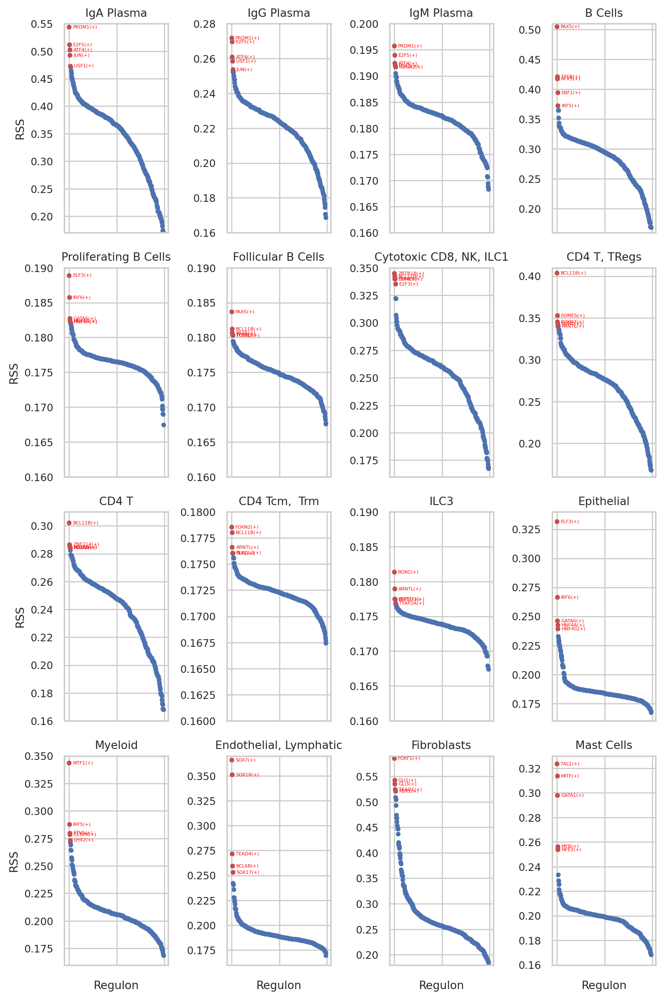

In [48]:
sns.set()
sns.set(style='whitegrid', font_scale=0.8)
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8), (ax9, ax10, ax11, ax12), (ax13, ax14, ax15, ax16)) = plt.subplots(4, 4, figsize=(8, 12), dpi=100)
plot_rss(rss, 'IgA Plasma', ax=ax1)
ax1.set_xlabel('')
plot_rss(rss, 'IgG Plasma', ax=ax2)
ax2.set_xlabel('')
ax2.set_ylabel('')
plot_rss(rss, 'IgM Plasma', ax=ax3)
ax3.set_xlabel('')
ax3.set_ylabel('')
plot_rss(rss, 'B Cells', ax=ax4)
ax4.set_xlabel('')
ax4.set_ylabel('')
plot_rss(rss, 'Proliferating B Cells', ax=ax5)
ax5.set_xlabel('')
plot_rss(rss, 'Follicular B Cells', ax=ax6)
ax6.set_ylabel('')
ax6.set_xlabel('')
plot_rss(rss, 'Cytotoxic CD8, NK, ILC1', ax=ax7)
ax7.set_ylabel('')
ax7.set_xlabel('')
plot_rss(rss, 'CD4 T, TRegs', ax=ax8)
ax8.set_ylabel('')
ax8.set_xlabel('')
plot_rss(rss, 'CD4 T', ax=ax9)
ax9.set_xlabel('')
plot_rss(rss, 'CD4 Tcm,  Trm', ax=ax10)
ax10.set_ylabel('')
ax10.set_xlabel('')
plot_rss(rss, 'ILC3', ax=ax11)
ax11.set_ylabel('')
ax11.set_xlabel('')
plot_rss(rss, 'Epithelial', ax=ax12)
ax12.set_ylabel('')
ax12.set_xlabel('')
plot_rss(rss, 'Myeloid', ax=ax13)
plot_rss(rss, 'Endothelial, Lymphatic', ax=ax14)
ax14.set_ylabel('')
plot_rss(rss, 'Fibroblasts', ax=ax15)
ax15.set_ylabel('')
plot_rss(rss, 'Mast Cells', ax=ax16)
ax16.set_ylabel('')
plt.tight_layout()
savesvg('PerianalCD_rss.svg', fig)

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


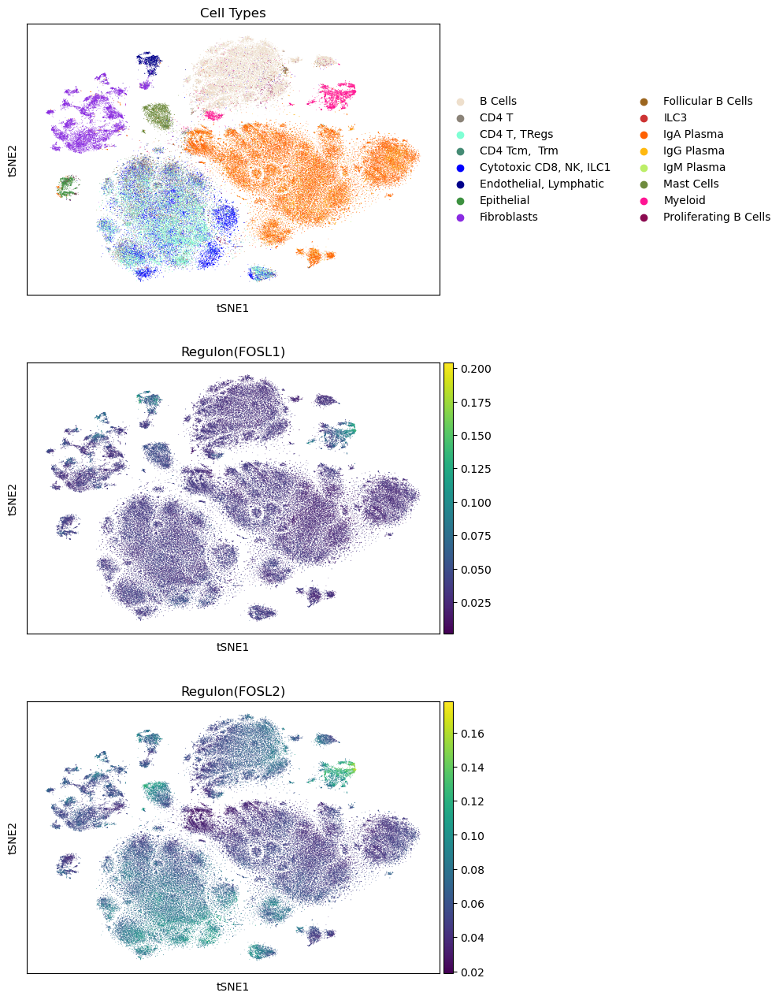

In [48]:
sc.pl.tsne(adata, color=['cell_type', 'Regulon(FOSL1(+))', 'Regulon(FOSL2(+))'],
           title=['Cell Types', 'Regulon(FOSL1)', 'Regulon(FOSL2)'], ncols=1, use_raw=False,
          save='PerianalCD_FOS_regulons.svg', palette=COLORS, cmap='viridis')

/home/cho_lab/jiayu/miniconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


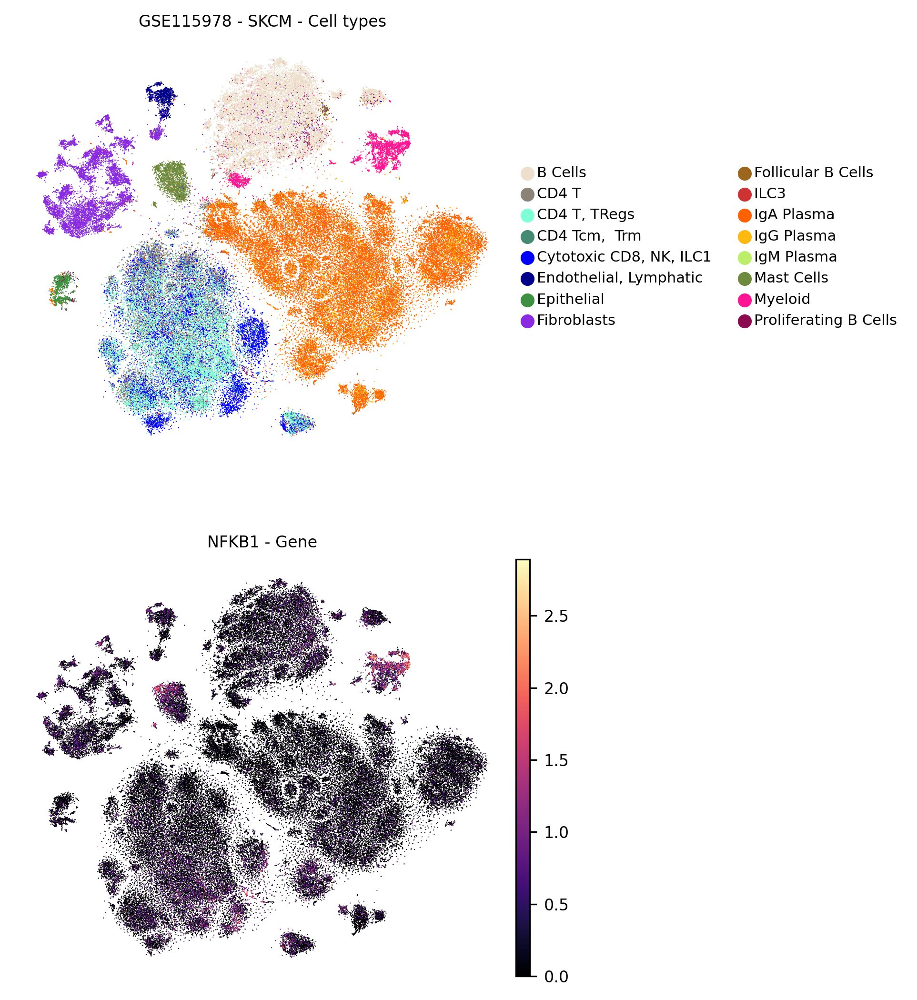

In [52]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'NFKB1'], 
           title=['GSE115978 - SKCM - Cell types', 'NFKB1 - Gene'], ncols=1, palette=COLORS, use_raw=False,
           cmap='magma')